|<h2>Course:</h2>|<h1><a href="https://udemy.com/course/dullms_x/?couponCode=202508" target="_blank">A deep understanding of AI language model mechanisms</a></h1>|
|-|:-:|
|<h2>Part 1:</h2>|<h1>Tokenizations and embeddings<h1>|
|<h2>Section:</h2>|<h1>Embedding spaces<h1>|
|<h2>Lecture:</h2>|<h1><b>CodeChallenge HELPER: Unembeddings (vectors to tokens)<b></h1>|

<br>

<h5><b>Teacher:</b> Mike X Cohen, <a href="https://sincxpress.com" target="_blank">sincxpress.com</a></h5>
<h5><b>Course URL:</b> <a href="https://udemy.com/course/dullms_x/?couponCode=202508" target="_blank">udemy.com/course/dullms_x/?couponCode=202508</a></h5>
<i>Using the code without the course may lead to confusion or errors.</i>

In [10]:
import numpy as np
import matplotlib.pyplot as plt

import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# Exercise 1: Import GPT2 model and tokenizer, and get dimensions

In [11]:
from transformers import GPT2Model,GPT2Tokenizer

# pretrained GPT-2 model and tokenizer
gpt2 = GPT2Model.from_pretrained('gpt2')
tokenizer = GPT2Tokenizer.from_pretrained('gpt2')

'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: d5ab7629-1255-4811-af48-bdc84222bc99)')' thrown while requesting HEAD https://huggingface.co/gpt2/resolve/main/config.json
Retrying in 1s [Retry 1/5].


In [12]:
# embeddings matrix
embeddings= gpt2.wte.weight.detach().numpy()

In [13]:
# find the size parameters in .config
gpt2.config

GPT2Config {
  "activation_function": "gelu_new",
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "dtype": "float32",
  "embd_pdrop": 0.1,
  "eos_token_id": 50256,
  "initializer_range": 0.02,
  "layer_norm_epsilon": 1e-05,
  "model_type": "gpt2",
  "n_ctx": 1024,
  "n_embd": 768,
  "n_head": 12,
  "n_inner": null,
  "n_layer": 12,
  "n_positions": 1024,
  "reorder_and_upcast_attn": false,
  "resid_pdrop": 0.1,
  "scale_attn_by_inverse_layer_idx": false,
  "scale_attn_weights": true,
  "summary_activation": null,
  "summary_first_dropout": 0.1,
  "summary_proj_to_labels": true,
  "summary_type": "cls_index",
  "summary_use_proj": true,
  "task_specific_params": {
    "text-generation": {
      "do_sample": true,
      "max_length": 50
    }
  },
  "transformers_version": "4.57.6",
  "use_cache": true,
  "vocab_size": 50257
}

In [14]:
# the properties we'll use later
print(f'Embedding dimensions: {gpt2.config.n_embd}')
print(f'Vocab size: {gpt2.config.vocab_size}')
print(f'Size of embeddings matrix: {embeddings.shape}')

Embedding dimensions: 768
Vocab size: 50257
Size of embeddings matrix: (50257, 768)


# Exercise 2: Real and random unembeddings

In [15]:
# unembeddings matrix as the transpose of the (real) embeddings
unembeddings = embeddings.T

# confirm that transposing matrix a copy
print('id of embeddings:  ',id(embeddings))
print('id of unembeddings:',id(unembeddings))

id of embeddings:   140676322465360
id of unembeddings: 140676322465456


In [16]:
# a random unembeddings matrix
unembeddingsRand = np.random.randn(embeddings.shape[1],embeddings.shape[0])

print(f'         Size of embeddings matrix: {embeddings.shape}')
print(f'Size of random unembeddings matrix: {unembeddingsRand.shape}')
print(f'  Size of real unembeddings matrix: {unembeddings.shape}')

         Size of embeddings matrix: (50257, 768)
Size of random unembeddings matrix: (768, 50257)
  Size of real unembeddings matrix: (768, 50257)


# Exercise 3: California embedding

In [17]:
# pick a word
seedword = ' California'

# its token index
seed_idx = tokenizer.encode(seedword)

# make sure it's one token
seed_idx

[3442]

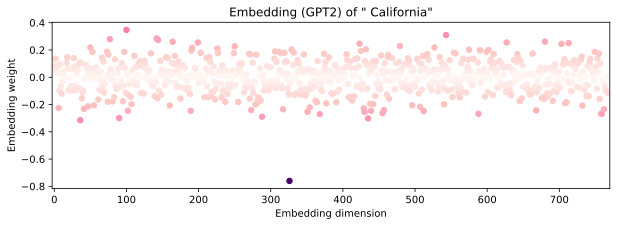

In [18]:
# find its embedding vector
embed_vector = embeddings[seed_idx,:].reshape(-1)

# plot it!
plt.figure(figsize=(10,3))
plt.scatter(np.arange(len(embed_vector)),embed_vector,s=30,c=abs(embed_vector),cmap='RdPu')
plt.gca().set(xlabel='Embedding dimension',ylabel='Embedding weight',xlim=[-3,gpt2.config.n_embd+2],
              title=f'Embedding (GPT2) of "{tokenizer.decode(seed_idx)}"')
plt.show()

In [19]:
# project the embedding vector onto the unembedding matrix
dpRand = embed_vector @ unembeddingsRand

# next token is the maximum dot product (unscaled cosine similarity)!
nextTokenRand_idx = np.argmax(dpRand)
nextTokenRand = tokenizer.decode([nextTokenRand_idx])
# check the sizes
print('embed_vector  X  unembeddings  =  dotproducts')
print(f'  {embed_vector.shape}       {unembeddingsRand.shape}      {dpRand.shape}')

embed_vector  X  unembeddings  =  dotproducts
  (768,)       (768, 50257)      (50257,)


In [20]:
# repeat for the real unembeddings matrix
dpReal = embed_vector @ unembeddings
nextTokenReal_idx = np.argmax(dpReal)
nextTokenReal = tokenizer.decode([nextTokenReal_idx])

In [21]:
print('** Random unembeddings matrix:')
print(f'   "{tokenizer.decode(seed_idx)}" has largest dot product with token "{nextTokenRand}"\n')

print('** Real unembeddings matrix:')
print(f'   "{tokenizer.decode(seed_idx)}" has largest dot product with token "{nextTokenReal}"\n')

** Random unembeddings matrix:
   " California" has largest dot product with token "holder"

** Real unembeddings matrix:
   " California" has largest dot product with token "California"



In [22]:
# plot it!
_,axs = plt.subplots(1,2,figsize=(12,3))
axs[0].scatter(range(tokenizer.vocab_size),dpRand,s=30,c=abs(dpRand),cmap='RdPu',alpha=.4)
axs[0].axvline(nextTokenRand_idx,linestyle='--',color='k',alpha=1/3)
axs[0].plot(nextTokenRand_idx,dpRand[0,nextTokenRand_idx],'gv')
axs[0].set(xlabel='Unembedding dimension',ylabel='Dot product',xlim=[-11,tokenizer.vocab_size+10],
              title=f'(Random) dot products with "{tokenizer.decode(seed_idx)}"')

axs[1].scatter(range(tokenizer.vocab_size),dpReal,s=30,c=abs(dpReal),cmap='RdPu',alpha=.4)
axs[1].axvline(nextTokenReal_idx,linestyle='--',color='k',alpha=1/3)
axs[1].plot(nextTokenReal_idx,dpReal[0,nextTokenReal_idx],'gv')
axs[1].set(xlabel='Unembedding dimension',ylabel='Dot product',xlim=[-11,tokenizer.vocab_size+10],
              title=f'(Real) dot products with "{tokenizer.decode(seed_idx)}"')


plt.tight_layout()
plt.show()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

# Exercise 4: Find top-10 unembeddings

In [ ]:
top10 = np.argsort(dpReal[0])[::-1][:10]

for i in top10:
  print(f'Dot product {dpReal[0,i]:6.3f} for token "{tokenizer.decode(i)}"')

# Exercise 5: Generate a token sequence

In [30]:
# sequence length
seq_len = 10

# initial seed
nextword = 'Israel'

# initializing a list that will contain the text
text = [nextword]


# loop to create the sequence
for i in range(seq_len-1):
  # step 1: tokenize
  seed_idx = tokenizer.encode(nextword)

  # step 2: get embedding vector
  embed_vector = embeddings[seed_idx,:].reshape(-1)

  # step 3: project onto unembedding matrix (dot products)
  dpReal = embed_vector @ unembeddings

  # step 4: find top10 projections
  top10 = np.argsort(dpReal)[::-1][:10]

  # step 5: randomly pick one for next token
  nextword = tokenizer.decode(np.random.choice(top10))


  # step 6: append the text
  text.append(nextword)


# print the final result!
print('Our very philosophically meaningful text:\n',' '.join(text))

Our very philosophically meaningful text:
 Israel Jews Palest Jews Muslims Allah Islam  Islamists Muslims  Muslims


In [ ]:
# sequence length
seq_len = 10

# initial seed
nextword = 'Israel'

# initializing a list that will contain the text
text = [nextword]


# loop to create the sequence
for i in range(seq_len-1):
  # step 1: tokenize
  seed_idx = tokenizer.encode(nextword)

  # step 2: get embedding vector
  embed_vector = embeddings[seed_idx,:].reshape(-1)

  # step 3: project onto unembedding matrix (dot products)
  dpReal = embed_vector @ unembeddings

  # step 4: find top10 projections
  top10 = np.argsort(dpReal)[::-1][:10]

  # step 5: randomly pick one for next token
  nextword = tokenizer.decode(np.random.choice(top10))


  # step 6: append the text
  text.append(nextword)


# print the final result!
print('Our very philosophically meaningful text:\n',' '.join(text))

Our very philosophically meaningful text:
 Israel Palestinian Palest  Israelis  Israelis anyahu usalem lehem terday theless


# Repeat with random unembeddings